# Proof-of-Concept: Chromatin optimal kappa algorithm, replicate 1

In this notebook, we examine intergenic regions and daughter-specific genes. The goal here is to show that we are indeed identifying daughter-specific changes, in the DSE1-4 genes. While appropriately minimizing false positive effects in control intergenic regions where there should be little change, and little differences between the mother and daughter branches.

We aim to find an optimal kappa value that maximizes signal (of DSE chromatin in DG1 compared to CG1) and minimizes false positives (of intergenic CG1/DG1 differences).

In [1]:
# Preamble, notebook setup and imports

%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%config Completer.use_jedi = False

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [2]:
from src.utils import mkdir_safe
from src.chromatin_deconvolution_solver import plot_example_fits
from src.chromatin_deconvolution_solver import plot_branches
from src.chromatin_model import plot_prediction
from src.geneset import get_deconvolved_geneset
from src.sgd import get_orfname
from src.RealDataReplication import read_n_fr_b
from src.chromatin_deconvolution_solver import subset_select_highest_G_indices


In [5]:
from src.chromatin_model import ChromatinModel
from src.config import load_default_chrom_configs

config1, config2 = load_default_chrom_configs()
chromatin_model1 = ChromatinModel(config1)


In [ ]:
from src.sgd import get_orfname
from src.sgd import read_nondubious_genes_dataset
from src.chromatin_gamma_search import ChromatinFindOptimalGamma
from src.chromatin_deconvolution_solver import ChromatinDeconvolveSolver

genes = read_nondubious_genes_dataset()

In [98]:
from src.timer import Timer
from src.find_optimal_kappa_chromatin import DSE_GENES, INTERGENICS
from src.find_optimal_kappa_chromatin import deconvolve_and_plot_gene

kappa = 1
chromatin_solver = deconvolve_and_plot_gene(config1, "CLN3", 0.01, kappa, None, 
    f_savepath=None, window=400, save_plots=False, verbose=True)


Loading trial replication profile, 2/17/25
Loading chromosome reads: 1
Applying a normalization for length distribution
0/4680 - 00:00:00.000
500/4680 - 00:00:00.445
1000/4680 - 00:00:32.874
1500/4680 - 00:01:37.197
2000/4680 - 00:02:44.891
2500/4680 - 00:03:53.489
3000/4680 - 00:05:03.759
3500/4680 - 00:06:13.152
4000/4680 - 00:07:19.867
4500/4680 - 00:08:25.455
Completed - 00:08:35.832


In [99]:
gene = genes[genes['gene'] == 'CLN3'].iloc[0]
span = gene.TSS-900, gene.TSS+900
chrom = gene.chr

(66945, 68745)


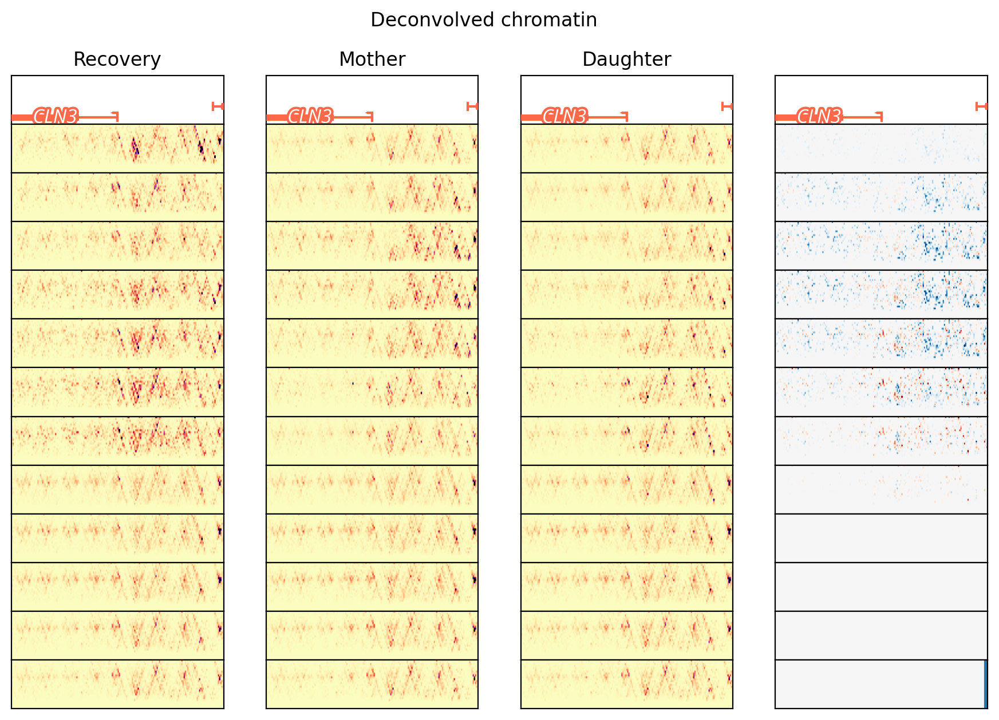

In [100]:
from src.chromatin_deconvolution_solver import plot_branches
fig = plot_branches(chromatin_solver.config, chrom, span, chromatin_solver.F,
                   figsize=(11, 7))
plt.axvline(68733)
plt.axvline(68727)

print(span)

In [102]:
from src.timer import Timer
from src.find_optimal_kappa_chromatin import DSE_GENES, INTERGENICS
from src.find_optimal_kappa_chromatin import deconvolve_and_plot_gene

chromatin_solver = deconvolve_and_plot_gene(config1, "DSE3", 0.01, 0, None, 
    f_savepath=None, window=1800, save_plots=False, verbose=True)


Loading trial replication profile, 2/17/25
Loading chromosome reads: 15
Applying a normalization for length distribution
0/4680 - 00:00:00.000
500/4680 - 00:00:00.459
1000/4680 - 00:00:23.791
1500/4680 - 00:01:23.750
2000/4680 - 00:02:27.895
2500/4680 - 00:03:31.235
3000/4680 - 00:04:39.574
3500/4680 - 00:05:48.905
4000/4680 - 00:06:55.889
4500/4680 - 00:07:56.460
Completed - 00:08:04.563


In [103]:
gene = genes[genes['gene'] == 'DSE3'].iloc[0]
span = gene.TSS-900, gene.TSS+900
chrom = gene.chr

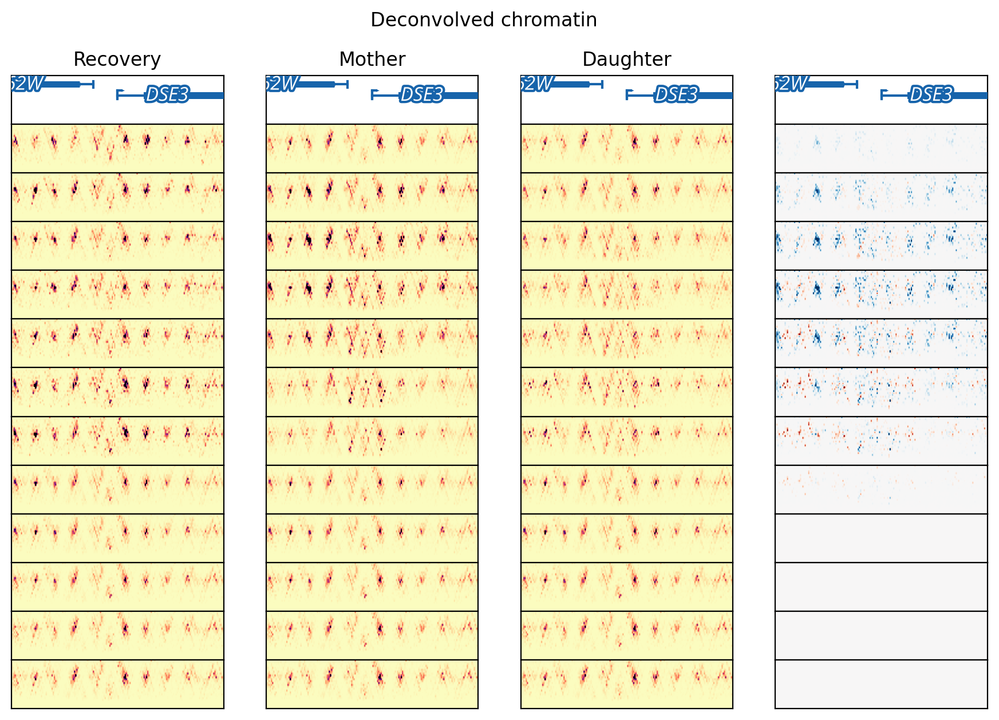

In [104]:
fig = plot_branches(chromatin_solver.config, chrom, span, chromatin_solver.F,
                   figsize=(11, 7))

In [124]:
from src.timer import Timer
from src.find_optimal_kappa_chromatin import DSE_GENES, INTERGENICS
from src.find_optimal_kappa_chromatin import deconvolve_and_plot_gene

window = 1000
win_2 = window//2
gene_name = 'FLO9'
chromatin_solver = deconvolve_and_plot_gene(config1, gene_name, 0.01, 0, None, 
    f_savepath=None, window=window, save_plots=False, verbose=True)


Loading trial replication profile, 2/17/25
No replication data for chr1, (27712, 28712). Reverting to no correction.
Loading chromosome reads: 1
Applying a normalization for length distribution
0/2600 - 00:00:00.000
500/2600 - 00:00:05.534
1000/2600 - 00:01:02.654
1500/2600 - 00:02:09.509
2000/2600 - 00:03:20.103
2500/2600 - 00:04:23.803
Completed - 00:04:27.623


In [125]:
gene = genes[genes['gene'] == gene_name].iloc[0]
span = gene.TSS-win_2, gene.TSS+win_2
chrom = gene.chr

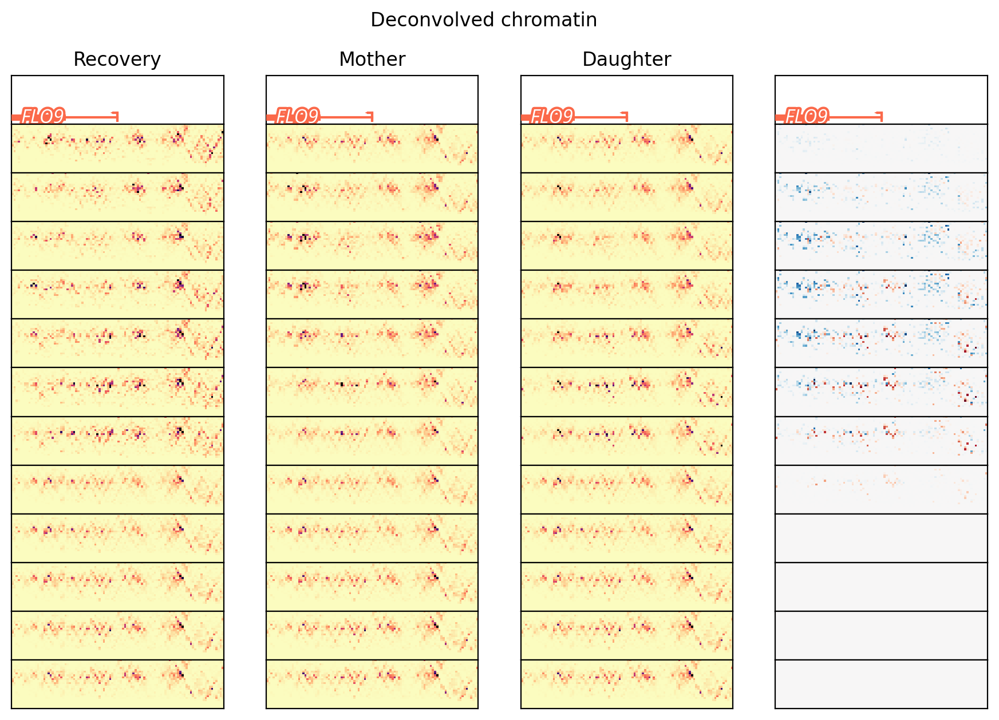

In [126]:
fig = plot_branches(chromatin_solver.config, chrom, span, chromatin_solver.F,
                   figsize=(11, 7))

(0.0, 3.0)

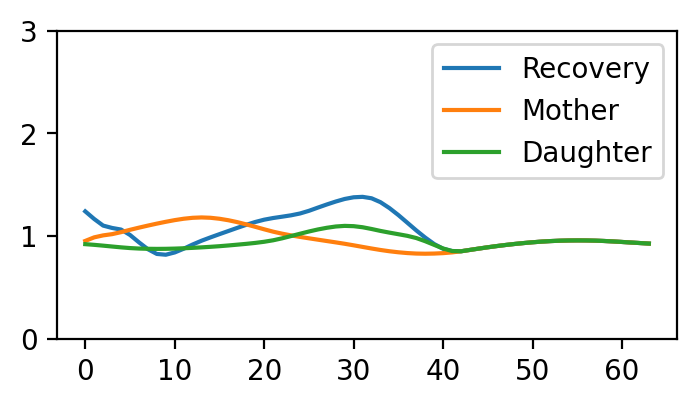

In [147]:
config = chromatin_solver.config

plt.figure(figsize=(4, 2))
plt.plot(chromatin_solver.F.mean(axis=1)[config.i_indices()], label="Recovery")
plt.plot(chromatin_solver.F.mean(axis=1)[config.t_indices()], label="Mother")
plt.plot(chromatin_solver.F.mean(axis=1)[config.b_indices()], label="Daughter")
plt.legend()
plt.ylim(0, 3)


0

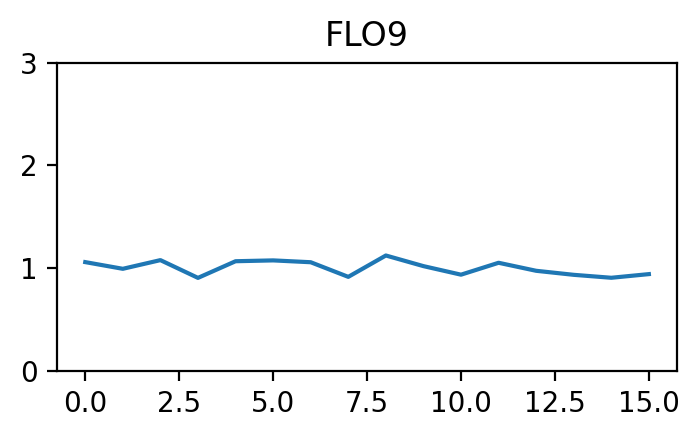

In [145]:
plt.figure(figsize=(4, 2))
plt.plot(chromatin_solver.G.mean(axis=1))
plt.ylim(0, 3)
plt.title("FLO9")
0

0

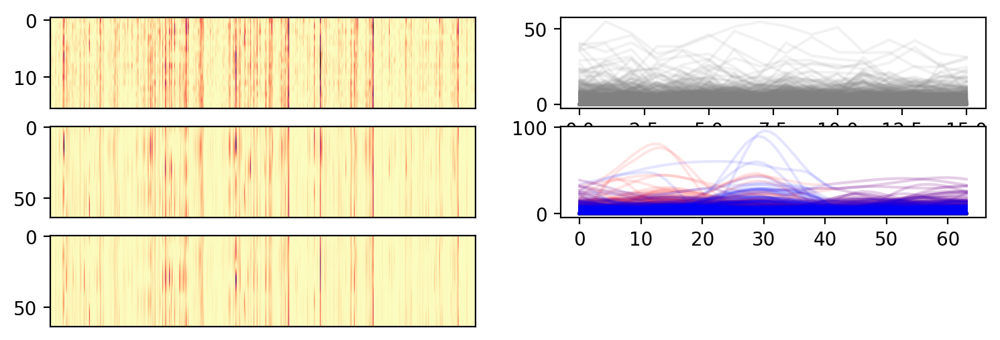

In [152]:
# FLO9 is a good example in which the reads in the window are fairly static as a whole,
# but the individual variation within the window cause some kind of bias to build up.
# can we control for this? Let's look at the individual bins, then stop and do some
# hypothesizing and planning.
plt.figure(figsize=(9, 3))
plt.subplot(3, 2, 1)
plt.imshow(chromatin_solver.G, cmap='magma_r', aspect='auto')
plt.xlim(1500, 2000)
plt.xticks([])

plt.subplot(3, 2, 2)
plt.plot(chromatin_solver.G, c='gray', alpha=0.1)

plt.subplot(3, 2, 3)
plt.imshow(chromatin_solver.F[config.t_indices()], cmap='magma_r', aspect='auto')
plt.xlim(1500, 2000)
plt.xticks([])

plt.subplot(3, 2, 5)
plt.imshow(chromatin_solver.F[config.b_indices()], cmap='magma_r', aspect='auto')
plt.xlim(1500, 2000)
plt.xticks([])

plt.subplot(3, 2, 4)
plt.plot(chromatin_solver.F[config.t_indices()], c='red', alpha=0.1)
plt.plot(chromatin_solver.F[config.b_indices()], c='blue', alpha=0.1)

0

In [ ]:
# Let's try a 10kb window, to get a better idea of the larger global effect.


In [701]:
window = 10000
win_2 = window//2
gene_name = 'FLO9'
chromatin_model_10KB, chromatin_solver_10KB = deconvolve_and_plot_gene(config1, gene_name, gamma=0.01,
    kappa=0.0002, output_directory=None, f_savepath=None, window=window, 
    save_plots=False, verbose=True)


Loading trial replication profile, 2/17/25
Loading chromosome reads: 7
Applying a normalization for length distribution


In [458]:
gene = genes[genes['gene'] == gene_name].iloc[0]
span = gene.TSS-win_2, gene.TSS+win_2
chrom = gene.chr

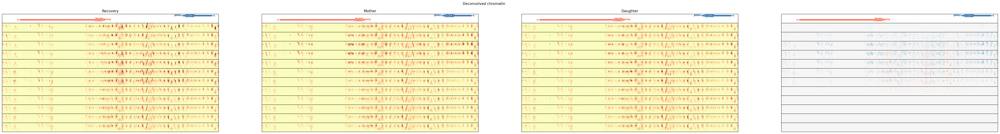

In [459]:
fig = plot_branches(chromatin_solver_10KB.config, chrom, span, chromatin_solver_10KB.F,
                   figsize=(60, 7))

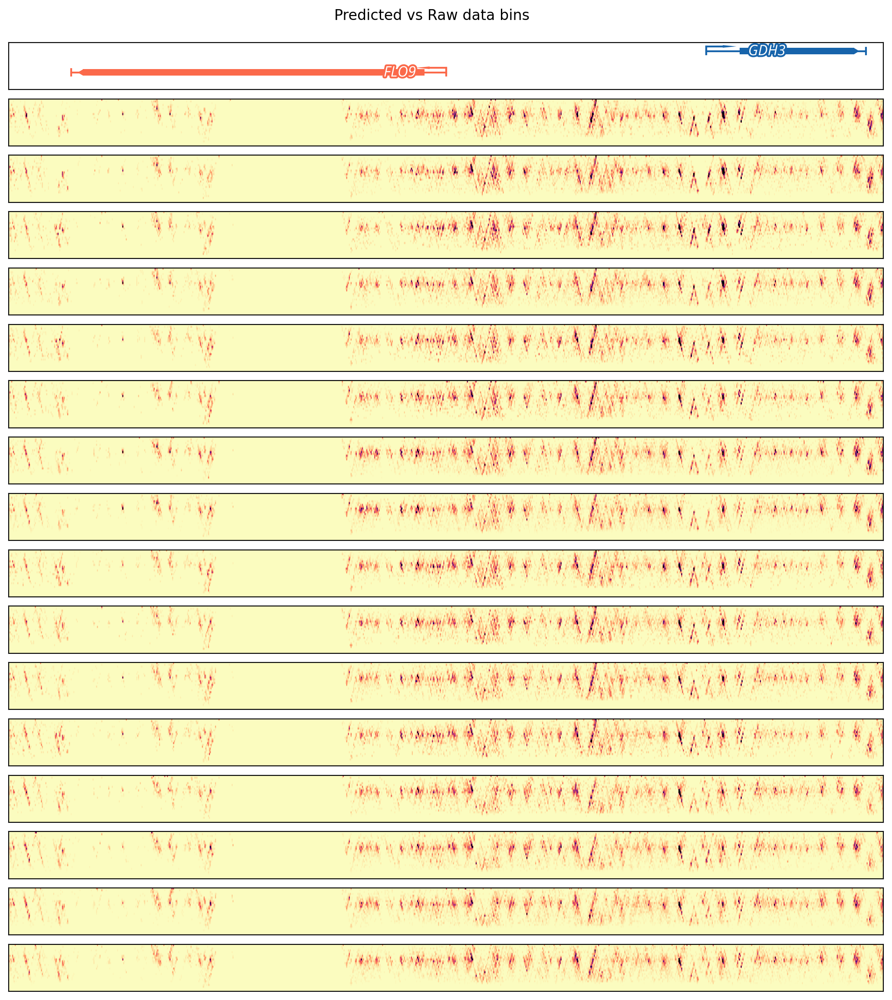

In [700]:
fig = plot_raw_G(G_10KBs, config, chrom, span, figsize=(13, 13))